# Setup

First, let's import a few common modules and my custom module, ensure MatplotLib plot figures inline.

In [1]:
# common import
import os
import sys
import warnings
from pprint import pprint

import numpy as np
import pandas as pd

from scipy import stats
from sklearn.cluster import KMeans
from efficient_apriori import apriori
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

%matplotlib inline
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from yellowbrick.cluster.elbow import kelbow_visualizer

In [2]:
# custom import

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from src.helper import *

In [3]:
# disable the warning for ipython
warnings.filterwarnings("ignore")

# plot parameters
mpl.rc('axes', labelsize=18)
mpl.rc('xtick', labelsize=14)
mpl.rc('ytick', labelsize=14)
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.dpi'] = 150
plt.style.use('seaborn-darkgrid')
sns.set_style('darkgrid')

# Load Data

Load data located in *data* folder of the project directory.
There are 4 datasets provided:
1. `department.csv`: Contains a generalized grouping of the products available in the dataset.
2. `order_product.csv`: Contains previous order contents for all customers. $reordered$ indicates that the customer has a previous order that contains this product. **Note**: *some orders will have no reordered items*.
3. `order.csv`: Contains information for each order. `order_dow`, for example, represents the weekday.
4. `product.csv`: Contains product information.

### Entity Relationship Diagram (ERD)
![](../img/ERD_diagram.png)

In [4]:
# load all the data into a dataframe

departments = pd.read_csv("../data/departments.csv")
order_products = pd.read_csv("../data/order_products.csv")
orders = pd.read_csv("../data/orders.csv")
products = pd.read_csv("../data/products.csv")

## 1. Describe the datasets and the eventual anomalies you find.

<div class="alert alert-block alert-info">
This is an information overview from the cleaned working dataframe:
<ul>
    <li>number of users: 102989</li>
    <li>number of orders: 187488</li>
    <li>number of items: 134</li>
    <li>average number of orders per user: 1.82</li>
    <li>average basket size: 9.3</li>
    <li>average percentage of reordered items: 57.98 %</li>
    <li>average days since last order: 11</li>
    <li>percentage of total anomalies orders: 6.26 %</li>
    <li><code>order_dow</code> is in <code>date.weekday</code> format which range from 0 (Monday) - 6 (Sunday).</li>
    <li><code>order_hour_of_day</code> is in 24 hours format range from 0 - 23 h.</li>
</ul>
</div>

<div class="alert alert-block alert-danger">
These are the actions performed on the cleaned working dataframe:
<ul>
    <li><code>days_since_prior_order</code> has 6.13 % missing values, which indicates a first time order from users.</li>
    <li><code>days_since_prior_order</code> seems to be capped at 30 days, for which we are using binning technique to workaround this.</li>
</ul>
</div>

<div class="alert alert-block alert-warning">
These points are what we have to keep in mind about the cleaned working dataframe:
<ul>
    <li><code>add_to_cart_order</code> and <code>order_number</code> are tail-heavy</li>
    <li>attributes have different scales, feature scaling needed</li>
</ul>
</div>

In [5]:
# check departments dataframe

df_information(departments)

The dataframe has 21 rows and 2 columns.
The dataframe has 1 columns with objects type.
The dataframe has 1 columns with number type.
The dataframe has 0 columns with bool type.


In [6]:
# get number of categories from objects type columns in departments dataframe

get_number_of_categories(departments)

department    21
dtype: int64

In [7]:
# check for missing values in departments dataframes

get_missing_value(departments, extented= True)

,data_type,number_missing,percent_missing
department_id,int64,0,0.0
department,object,0,0.0


In [8]:
# preview the departments dataframe
departments.head()

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


<div class='alert alert-block alert-info'>
    The <code>department</code> data set from <code>departments.csv</code> has:
    <ul>
    <li>21 rows and 2 columns</li>
    <li>1 column of numerical type</li>
    <li>1 column of categorical type with 21 categories</li>
    <li>no missing values</li>
    </ul>
</div>

In [9]:
# check order_products dataframe

df_information(order_products)

The dataframe has 2019501 rows and 4 columns.
The dataframe has 0 columns with objects type.
The dataframe has 4 columns with number type.
The dataframe has 0 columns with bool type.


In [10]:
# check for missing values in order_products dataframes

get_missing_value(order_products, extented= True)

,data_type,number_missing,percent_missing
order_id,int64,0,0.0
product_id,int64,0,0.0
add_to_cart_order,int64,0,0.0
reordered,int64,0,0.0


In [11]:
# check number of orders and products

print(f"The data has {order_products.order_id.nunique()} unique orders, and {order_products.product_id.nunique()} unique products")

The data has 200000 unique orders, and 134 unique products


In [12]:
# preview order_products dataframe

order_products.head()

,order_id,product_id,add_to_cart_order,reordered
0,10,24,1,1
1,10,83,2,1
2,10,16,3,0
3,10,24,4,1
4,10,83,5,1


<div class='alert alert-block alert-info'>
    The <code>order_products</code> data set from <code>order_products.csv</code> has:
    <ul>
    <li>2019501 rows and 4 columns</li>
    <li>4 columns of numerical type</li>
    <li>200000 unique orders</li>
    <li>134 unique products</li>
    <li>no missing values</li>
    </ul>
</div>

In [13]:
# check orders dataframe

df_information(orders)

The dataframe has 200000 rows and 6 columns.
The dataframe has 0 columns with objects type.
The dataframe has 6 columns with number type.
The dataframe has 0 columns with bool type.


In [14]:
# check for missing values in orders dataframes

get_missing_value(orders, extented= True)

,data_type,number_missing,percent_missing
days_since_prior_order,float64,12254,6.13
order_id,int64,0,0.00
user_id,int64,0,0.00
order_number,int64,0,0.00
order_dow,int64,0,0.00
order_hour_of_day,int64,0,0.00


`day_since_prior_order` has 12254 missing values, which is 6.13% of dataset

In [15]:
# check the missing values row in orders dataframe

orders[orders.days_since_prior_order.isnull()]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2425083,49125,1,2,18,NaN
1,1944304,162867,1,3,17,NaN
6,1378095,73110,1,6,10,NaN
12,763857,195070,1,5,2,NaN
46,49056,14451,1,1,11,NaN
...,...,...,...,...,...,...
199933,169343,179472,1,4,16,NaN
199961,1328634,141083,1,6,13,NaN
199970,1294790,151137,1,1,10,NaN
199977,89567,35113,1,3,6,NaN


We suspect that the missing values in `day_since_prior_order` indicated a first order for the users.

In [16]:
# check the variance of order_number when days_since_prior_order is missing

orders[orders.days_since_prior_order.isnull()].order_number.unique()

array([1])

The variance of `order_number` when `days_since_prior_order` is missing is 0 with only value = 1, which indicates a first order from the user. We will fill this value with **negative** value to differentiate it.

In [17]:
# fill missing values in days_since_prior_order with -1

orders.days_since_prior_order = orders.days_since_prior_order.fillna(-1)

In [18]:
# check the missing values to make sure there are no missing values

get_missing_value(orders, extented= True)

,data_type,number_missing,percent_missing
order_id,int64,0,0.0
user_id,int64,0,0.0
order_number,int64,0,0.0
order_dow,int64,0,0.0
order_hour_of_day,int64,0,0.0
days_since_prior_order,float64,0,0.0


In [19]:
# check whether order_dow is weekday or isoweekday

print("The min value of order_dow is: ", orders.order_dow.min())
print("The max value of order_dow is: ", orders.order_dow.max())

The min value of order_dow is:  0
The max value of order_dow is:  6


The `oreder_dow` is `date.weekday()`, where Monday is 0 and Sunday is 6.

In [20]:
# check format of time of order_hour_of_day

print("The min value of order_hour_of_day is: ", orders.order_hour_of_day.min())
print("The max value of order_hour_of_day is: ", orders.order_hour_of_day.max())

The min value of order_hour_of_day is:  0
The max value of order_hour_of_day is:  23


The time format of `order_hour_of_day` is 24 hours format.

In [21]:
# check the number of unique order and user

print(f"The data has {orders.order_id.nunique()} unique orders, and {orders.user_id.nunique()} unique users")

The data has 200000 unique orders, and 105273 unique users


In [22]:
# preview order dataframe

orders.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2425083,49125,1,2,18,-1.0
1,1944304,162867,1,3,17,-1.0
2,1201011,147243,14,0,16,3.0
3,1906860,195275,81,1,11,3.0
4,2766469,58222,3,6,11,6.0


<div class='alert alert-block alert-info'>
    The <code>orders</code> data set from <code>orders.csv</code> has:
    <ul>
    <li>200000 rows and 6 columns</li>
    <li>6 columns of numerical type</li>
    <li>200000 unique orders</li>
    <li>105273 unique users</li>
    <li><code>order_dow</code> is in <code>date.weekday()</code> fromat range from 0 (Monday) - 6 (Sunday)</li>
    <li><code>order_hour_of_day</code> is in 24 hours format range from 0 - 23 h</li>
    </ul>
</div>

<div class='alert alert-block alert-danger'>
    The actions taken on <code>orders</code> data set are:
    <li><code>days_since_prior_order</code> has 6.13% missing values, which indicated first order making by user (<strong>filled with -1</strong>)</li>
    </ul>
</div>

In [23]:
# check products dataframe

df_information(products)

The dataframe has 134 rows and 3 columns.
The dataframe has 1 columns with objects type.
The dataframe has 2 columns with number type.
The dataframe has 0 columns with bool type.


In [24]:
# get number of categories from objects type columns in products dataframe

get_number_of_categories(products)

product_name    134
dtype: int64

In [25]:
# check for missing values in products dataframes

get_missing_value(products, extented= True)

,data_type,number_missing,percent_missing
product_id,int64,0,0.0
department_id,int64,0,0.0
product_name,object,0,0.0


In [26]:
# preview products dataframe

products.head()

,product_id,department_id,product_name
0,61,19,cookies cakes
1,104,13,spices seasonings
2,94,7,tea
3,38,1,frozen meals
4,5,13,marinades meat preparation


<div class='alert alert-block alert-info'>
    The <code>products</code> data set from <code>products.csv</code> has:
    <ul>
    <li>134 rows and 2 columns</li>
    <li>2 columns of numerical type</li>
    <li>1 column of categorical type with 134 categories</li>
    <li>no missing values</li>
    </ul>
</div>

In [27]:
# merge all data to working dataframe

dfs_merged = pd.merge(pd.merge(pd.merge(orders, order_products, on="order_id", how="left"), products, on="product_id", how="left"), departments, on="department_id", how="left")
dfs_merged = dfs_merged.sort_values(by = ["user_id", "order_number", "reordered", "add_to_cart_order"])

In [28]:
# check working dataframe information

df_information(dfs_merged)

The dataframe has 2019501 rows and 12 columns.
The dataframe has 2 columns with objects type.
The dataframe has 10 columns with number type.
The dataframe has 0 columns with bool type.


In [29]:
# check for missing values in working dataframes

get_missing_value(dfs_merged, extented= True)

,data_type,number_missing,percent_missing
order_id,int64,0,0.0
user_id,int64,0,0.0
order_number,int64,0,0.0
order_dow,int64,0,0.0
order_hour_of_day,int64,0,0.0
days_since_prior_order,float64,0,0.0
product_id,int64,0,0.0
add_to_cart_order,int64,0,0.0
reordered,int64,0,0.0
department_id,int64,0,0.0


In [30]:
# check number of categories from objects type columns in working dataframe

get_number_of_categories(dfs_merged)

product_name    134
department       21
dtype: int64

In [31]:
# preview working dataframe

dfs_merged.head()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,product_name,department
1497779,1501582,2,2,5,10,10.0,24,1,0,4,fresh fruits,produce
1497780,1501582,2,2,5,10,10.0,21,2,0,16,packaged cheese,dairy eggs
1497781,1501582,2,2,5,10,10.0,78,3,0,19,crackers,snacks
1497783,1501582,2,2,5,10,10.0,107,5,0,19,chips pretzels,snacks
1497784,1501582,2,2,5,10,10.0,67,6,0,20,fresh dips tapenades,deli


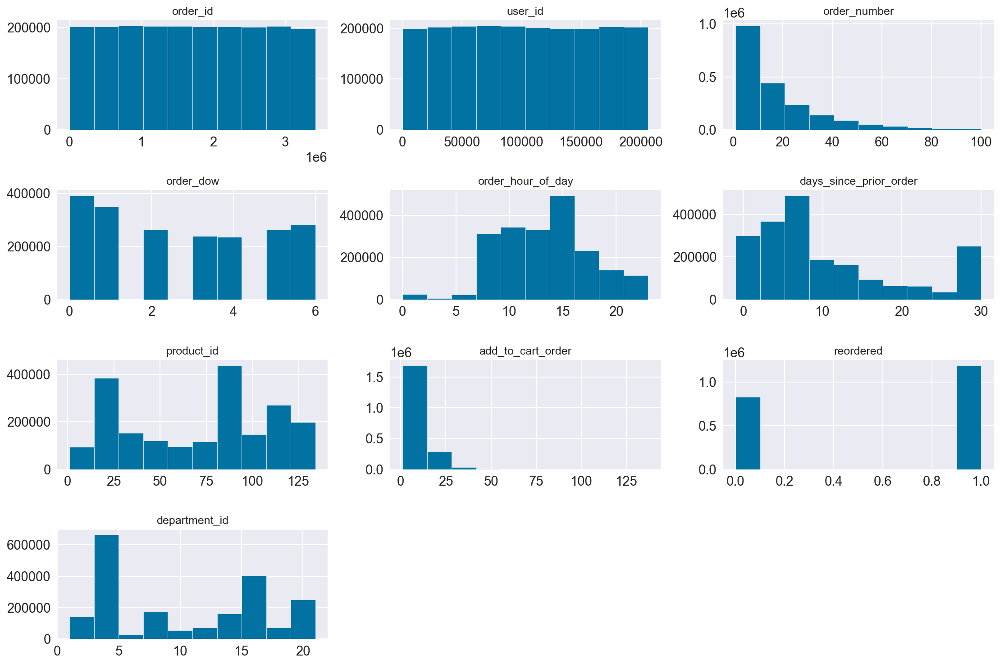

In [32]:
# plot histogram of working dataframe to see the distribution of each attribute

dfs_merged.hist();
# save_fig("histogram_working_dataframe");

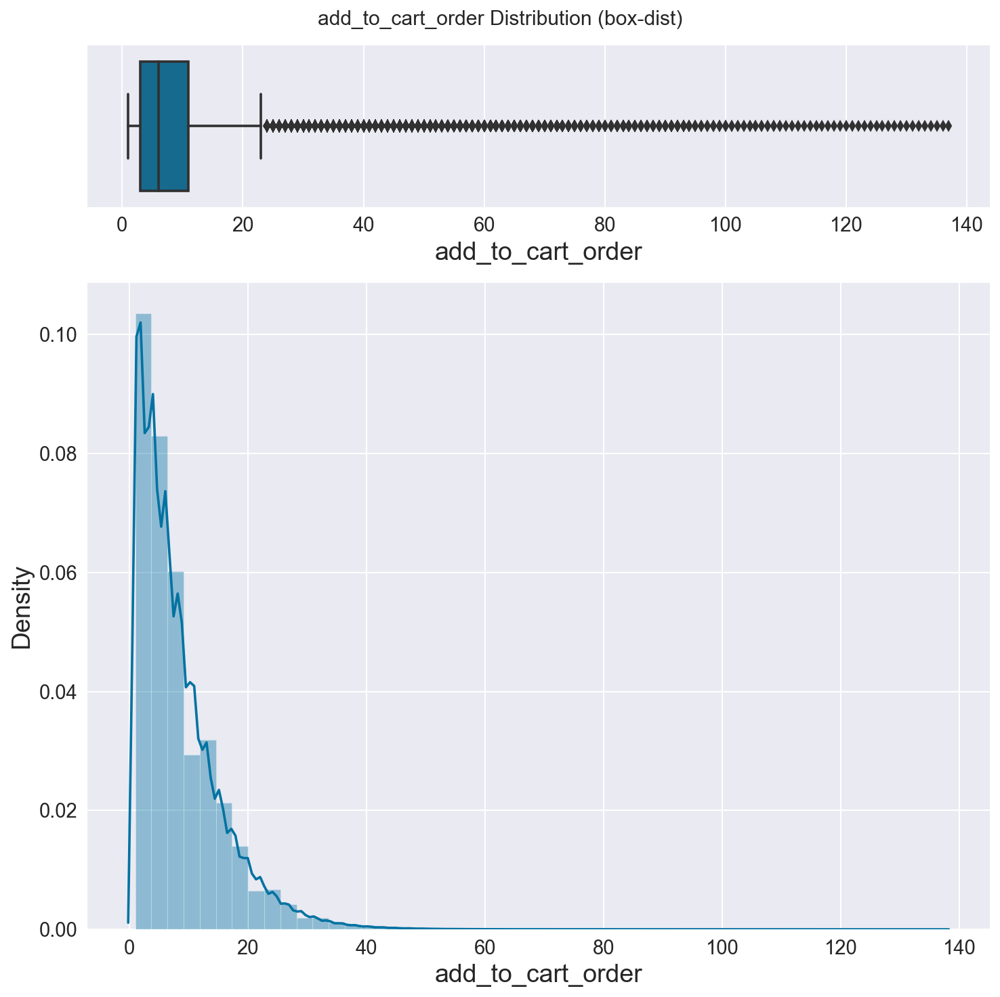

In [33]:
# plot box-dist to see the distribution of add_to_cart_order

plot_box_dist("add_to_cart_order", dfs_merged);
# save_fig("box_dist_add_to_cart_order")

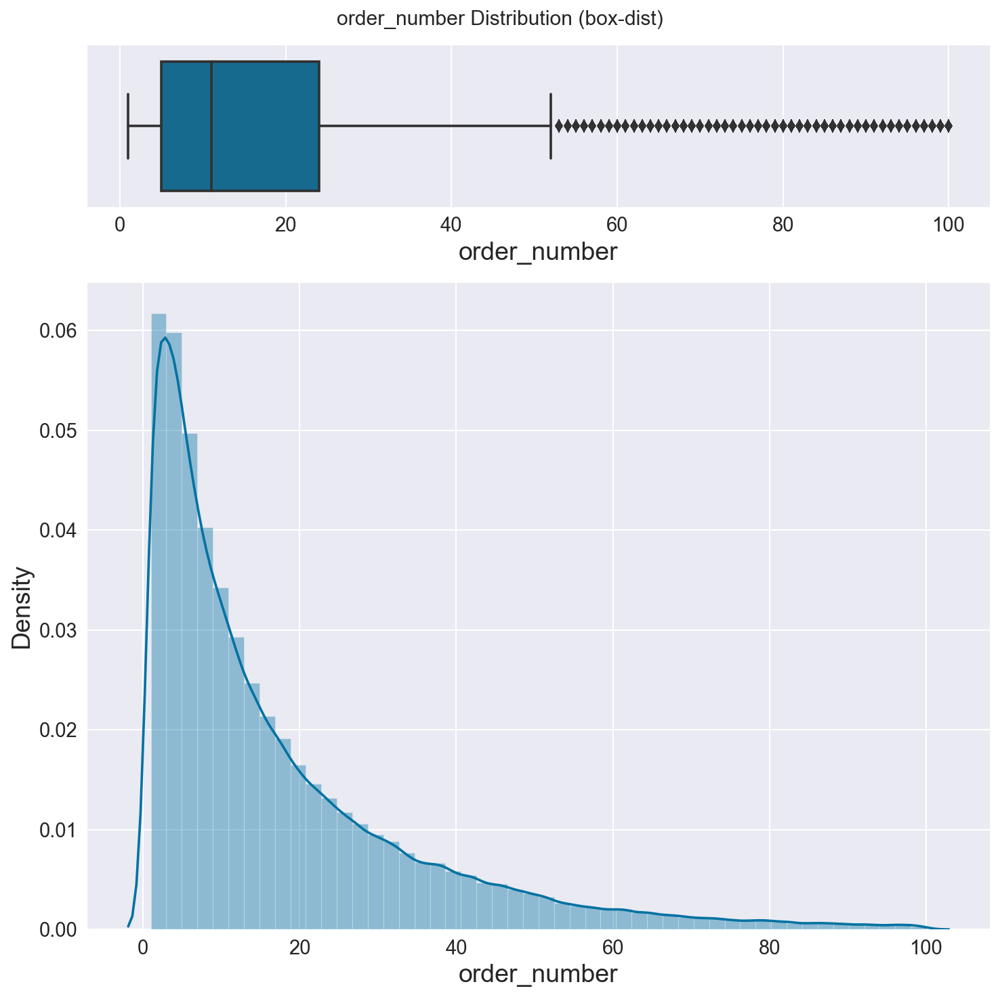

In [34]:
# plot box-dist to see the distribution of order_number

plot_box_dist("order_number", dfs_merged);
# save_fig("box_dist_order_number")

<div class='alert alert-block alert-warning'>
    There are a few things we notice from the histogram and box-dist plot:
    <ol>
    <li><code>day_since_prior_order</code> seems to be <strong>capped</strong> at 30 days</li>
    <li><code>add_to_cart_order</code> and <code>order_number</code> are <strong>tail-heavy</strong>: They extend much farther to the right of the median than the left</li>
    <li>The attributes have different scales. We must do <strong>feature scaling</strong></li>
    </ol>
</div>

In [35]:
# get outliers outside of 2.7 std (1.5 IOR) from order_number and add_to_cart_order with zscore

outlier_bigorder = dfs_merged[(np.abs(stats.zscore(dfs_merged.add_to_cart_order)) > 2.7)]
outlier_freqbuyer = dfs_merged[(np.abs(stats.zscore(dfs_merged.order_number)) > 2.7)]

In [36]:
# remove outlier from the working dataset

outlier_orders = list(set(outlier_bigorder.order_id.unique()) | set(outlier_freqbuyer.order_id.unique()))
dfs_clean = dfs_merged[~dfs_merged.order_id.isin(outlier_orders)]

We will use binning technique to bin `days_since_prior_order` to work around the capping problem.

|bin_id|days_since_prior_order (days)|Descriptions|
|:---|:---:|---:|
|0| (-1)| First order|
|1| (0)| Same day order|
|2| (1 - 7)| Same week order|
|3|(8 - 14)| Bi week order|
|4|(15 - 29)| Same month order|
|5|(30)| More than a month order|

In [37]:
# bin days_since_prior_order

dfs_clean["bin_days_since_prior_order"] = pd.cut(dfs_clean.days_since_prior_order, bins=[-np.inf,-1,0,7,14,29,np.inf], labels=["first order","same day order","same week order","bi week order","same month order","more than a month order"])

In [38]:
# Big numbers of working dataframe
print("number of users:", dfs_clean.user_id.nunique())
print("number of orders:", dfs_clean.order_id.nunique())
print("number of items:", dfs_clean.product_id.nunique())
print("average number of order per user:", round(dfs_clean.order_id.nunique() / dfs_clean.user_id.nunique() ,2))
print("average basket size:", round(dfs_clean.__len__() / dfs_clean.order_id.nunique() ,2))
print("percentage of reordered items:", round(dfs_clean.reordered.mean() * 100, 2))
print("average days since last order:", int(dfs_clean[dfs_clean.days_since_prior_order >= 0].days_since_prior_order.mean()))
print("percentage of total anomalies orders:", round((outlier_orders.__len__() * 100 / dfs_merged.order_id.nunique()), 2))


number of users: 102989
number of orders: 187488
number of items: 134
average number of order per user: 1.82
average basket size: 9.3
percentage of reordered items: 57.98
average days since last order: 11
percentage of total anomalies orders: 6.26


## 2. Which patterns do you find in the purchasing behavior of the customers?


<div class='alert alert-block alert-info'>
    <ul>
    <li>Monday and Tuesday mornings are the peak time with most order numbers and items sold</li>
    <li>Friday has the least activities</li>
    <li>Usual activity time is during 07:00 - 19:00</li>
    <li>Most of the orders are within a week from the last one</li>
    <li>There are rarely any same day orders</li>
    <li>There is a slight difference within the ranking of the departments and products when comparing the weekend and weekdays</li>
    <li>We can identify 18 patterns of purchasing behavior</li>
    </ul>
</div>

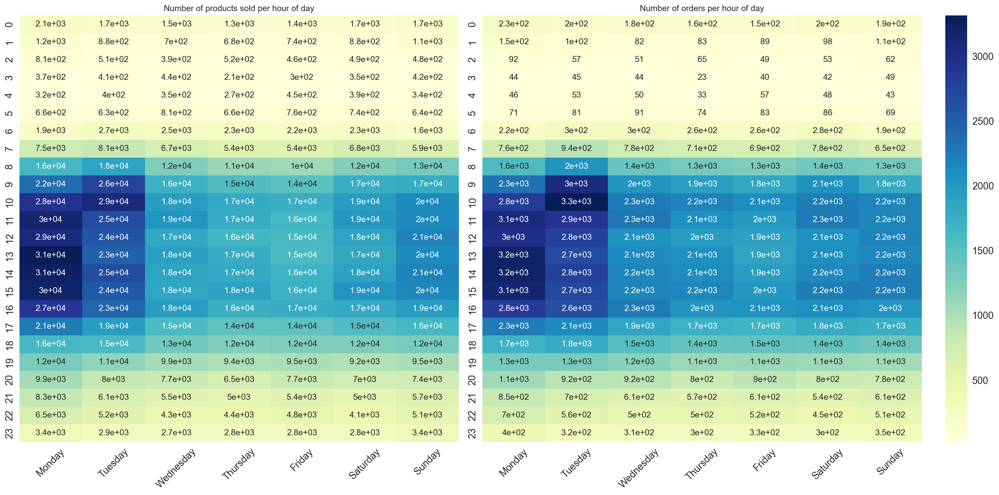

In [39]:
# When did the users buy our products

fig, (ax1, ax2, axcb) = plt.subplots(1,3,gridspec_kw={'width_ratios':[1,1,0.05]}, figsize = (20,10))
ax1.get_shared_y_axes().join(ax2)
h1 = sns.heatmap(pd.crosstab(dfs_clean.order_hour_of_day, dfs_clean.order_dow), cmap="YlGnBu", annot= True, cbar=False, ax= ax1)
h1.set_ylabel("")
h1.set_xlabel("")
ax1.set_title("Number of products sold per hour of day")
h2 = sns.heatmap(pd.crosstab(orders.order_hour_of_day, orders.order_dow), cmap="YlGnBu", annot= True, ax= ax2, cbar_ax= axcb)
h2.set_ylabel("")
h2.set_xlabel("")
ax2.set_title("Number of orders per hour of day")

for ax in [ax1, ax2]:
    ax.set_xticklabels(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], rotation= 45)

# save_fig("when_did_the_users_buy_our_products")

We can see that Mondays and Tuesdays have the most orders and on which the most items are sold during the week, specifically, **Monday afternoon and Tuesday morning** and Friday is least active.
Moreover, we can see that the usual active hours for our customers are between *07:00 to 19:00*.

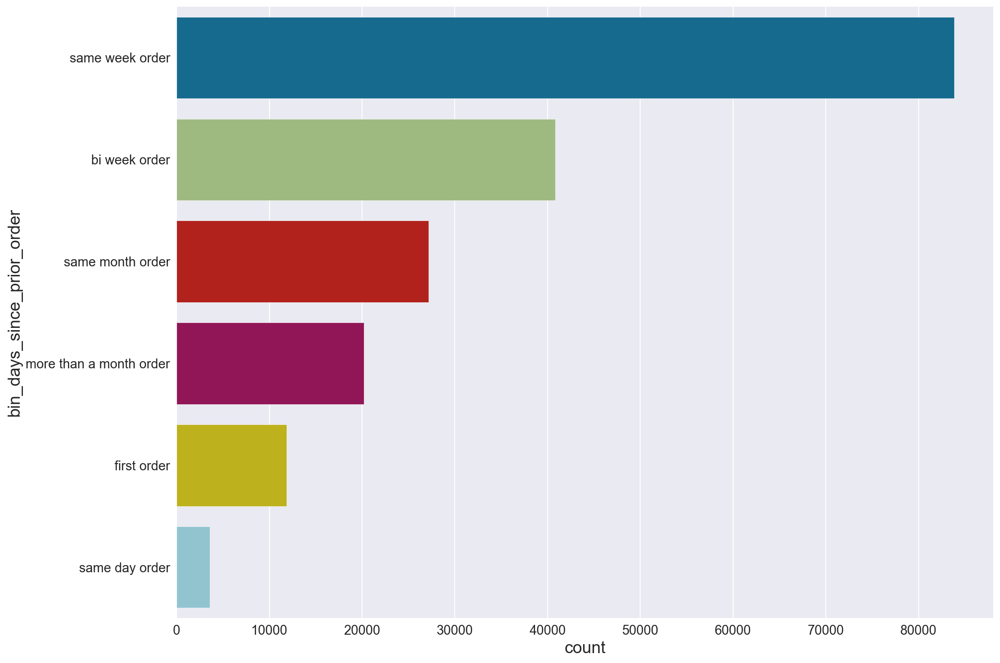

In [40]:
# how frequently did the user buy our products
sns.countplot(y=dfs_clean.groupby(["user_id","order_id"]).bin_days_since_prior_order.first(),
              order= dfs_clean.groupby(["user_id","order_id"]).bin_days_since_prior_order.first().value_counts().index);

# save_fig("how_frequently_did_the_user_buy_our_products");

<div class='alert alert-block alert-info'>
We can see that users usually reorder within a week, and rarely order twice on the same day.
</div>

Now, we will try to find a link between items with **Apriori Algorithm**. Apriori is a association rule learning technique to determine if certain data points are more likely to occur toether. 

In [41]:
# what did user buy together

apriori_df = dfs_clean[['order_id', 'add_to_cart_order', 'product_name']].pivot(index='order_id', columns='add_to_cart_order', values='product_name')
txns= apriori_df.stack().groupby(level=0).apply(list).tolist()
itemsets, rules = apriori(txns, min_support=0.1, min_confidence=0.5, verbosity= 1)

Generating itemsets.
 Counting itemsets of length 1.
  Found 134 candidate itemsets of length 1.
  Found 15 large itemsets of length 1.
 Counting itemsets of length 2.
  Found 105 candidate itemsets of length 2.
  Found 14 large itemsets of length 2.
 Counting itemsets of length 3.
  Found 8 candidate itemsets of length 3.
  Found 2 large itemsets of length 3.
 Counting itemsets of length 4.
  Found 0 candidate itemsets of length 4.
Itemset generation terminated.

Generating rules from itemsets.
 Generating rules of size 2.
 Generating rules of size 3.
Rule generation terminated.



In [42]:
# check for itemsets

pprint(itemsets)

{1: {('bread',): 28850,
     ('chips pretzels',): 29938,
     ('crackers',): 19867,
     ('eggs',): 24301,
     ('fresh fruits',): 101730,
     ('fresh vegetables',): 80679,
     ('frozen produce',): 21516,
     ('ice cream ice',): 19872,
     ('milk',): 43585,
     ('packaged cheese',): 40791,
     ('packaged vegetables fruits',): 65760,
     ('refrigerated',): 23821,
     ('soy lactosefree',): 30023,
     ('water seltzer sparkling water',): 35190,
     ('yogurt',): 46955},
 2: {('bread', 'fresh fruits'): 19080,
     ('fresh fruits', 'fresh vegetables'): 56431,
     ('fresh fruits', 'milk'): 28552,
     ('fresh fruits', 'packaged cheese'): 26506,
     ('fresh fruits', 'packaged vegetables fruits'): 47515,
     ('fresh fruits', 'soy lactosefree'): 20325,
     ('fresh fruits', 'water seltzer sparkling water'): 19407,
     ('fresh fruits', 'yogurt'): 32558,
     ('fresh vegetables', 'milk'): 21233,
     ('fresh vegetables', 'packaged cheese'): 22936,
     ('fresh vegetables', 'packaged v

In [43]:
# check for rules for apriori algorithm

for item in sorted(rules, key=lambda item: (item.lift, item.conviction), reverse= True):
    print(item)

{fresh fruits, fresh vegetables} -> {packaged vegetables fruits} (conf: 0.566, supp: 0.170, lift: 1.614, conv: 1.497)
{fresh fruits, packaged vegetables fruits} -> {fresh vegetables} (conf: 0.672, supp: 0.170, lift: 1.563, conv: 1.739)
{fresh vegetables, yogurt} -> {fresh fruits} (conf: 0.798, supp: 0.104, lift: 1.471, conv: 2.268)
{packaged vegetables fruits} -> {fresh vegetables} (conf: 0.624, supp: 0.219, lift: 1.451, conv: 1.516)
{fresh vegetables} -> {packaged vegetables fruits} (conf: 0.509, supp: 0.219, lift: 1.451, conv: 1.322)
{fresh vegetables, packaged vegetables fruits} -> {fresh fruits} (conf: 0.778, supp: 0.170, lift: 1.435, conv: 2.064)
{fresh fruits, yogurt} -> {fresh vegetables} (conf: 0.601, supp: 0.104, lift: 1.398, conv: 1.429)
{packaged vegetables fruits} -> {fresh fruits} (conf: 0.723, supp: 0.253, lift: 1.332, conv: 1.649)
{packaged cheese} -> {fresh vegetables} (conf: 0.562, supp: 0.122, lift: 1.307, conv: 1.301)
{fresh vegetables} -> {fresh fruits} (conf: 0.699

From this we can see some interesting patterns such as:
* people who buy *fresh vegetables* -> *yogurt* have a 79.8% chance of buying *fresh fruits* next based on 10.4% of occurance in the dataset
* people who buy *fresh vegetables* -> *packaged vegetables* have a 77.8% chance of buying *fresh fruits* next based on 17% of occurance in the dataset

## 3. What are the categories and products the customer are most interested in?

In [44]:
# what is the most and least popular departments

print("most popular department:", dfs_clean.department.value_counts().idxmax())
print("least popular department:", dfs_clean.department.value_counts().idxmin())

most popular department: produce
least popular department: bulk


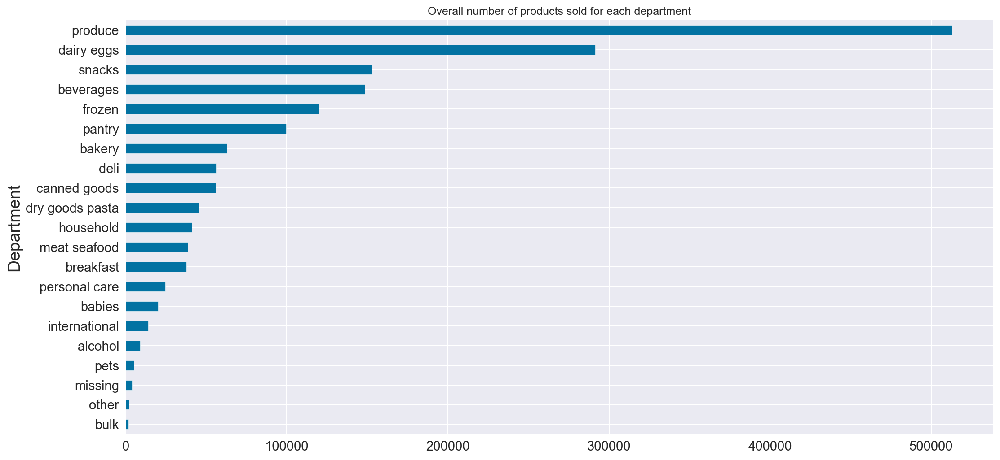

In [45]:
# distribution of numbers products sold based on department

dfs_clean.department.value_counts(ascending= True).plot(kind="barh", figsize=(15, 7), xlabel= "Department", title= "Overall number of products sold for each department");
# save_fig("overall_number_of_products_sold_for_each_department");

In [46]:
# top and bottom departments

print(f"The top 3 departments overall are: {dfs_clean.department.value_counts().nlargest(3).index.to_list()}")
print(f"The bottom 3 departments overall are: {dfs_clean.department.value_counts().nsmallest(3).index.to_list()}")

The top 3 departments overall are: ['produce', 'dairy eggs', 'snacks']
The bottom 3 departments overall are: ['bulk', 'other', 'missing']


In [47]:
# what is the most and least popular product

print("most popular product:", dfs_merged.product_name.value_counts().idxmax())
print("least popular product:", dfs_merged.product_name.value_counts().idxmin())

most popular product: fresh fruits
least popular product: frozen juice


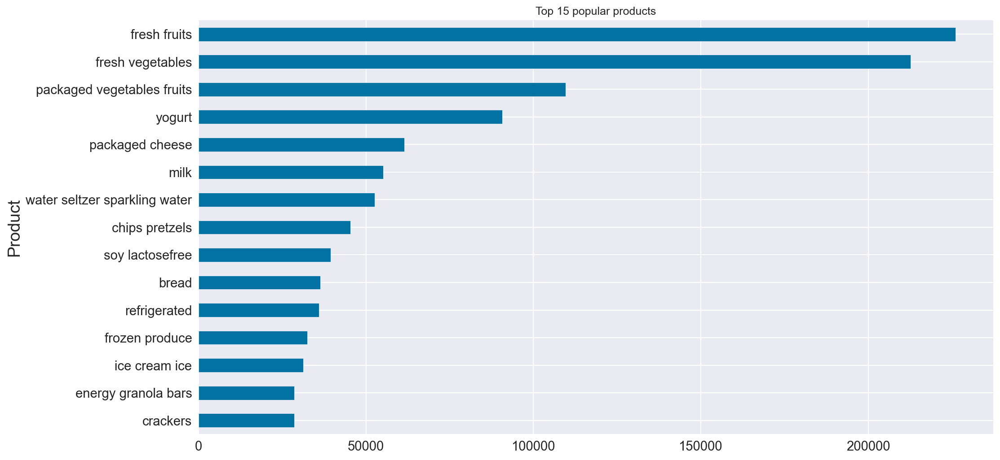

In [48]:
# what are the top 15 products

dfs_merged.product_name.value_counts(ascending= True).iloc[-15:].plot(kind="barh", figsize=(15, 7), xlabel= "Product", title= "Top 15 popular products");
# save_fig("Top_15_popular_products_overall");

''

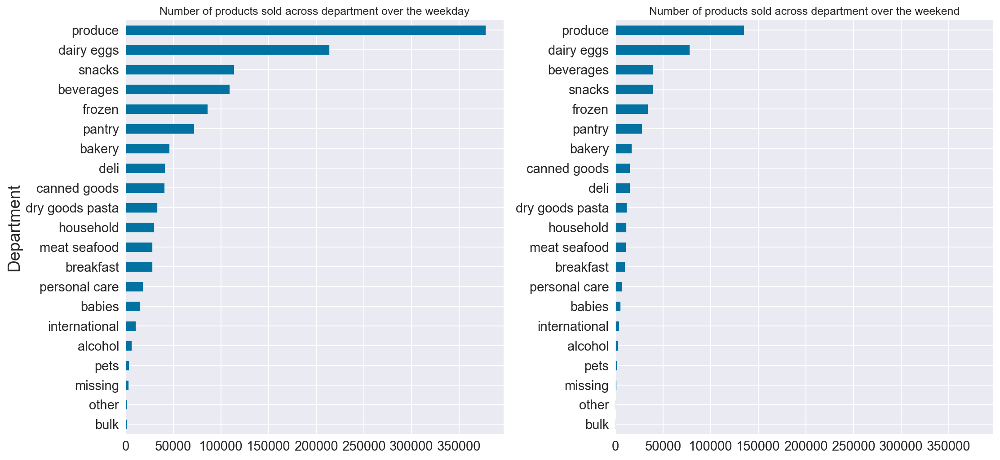

In [49]:
# is there different in sales of department/products on weekend

dfs_weekday = dfs_clean[(dfs_clean.order_dow >=0) & (dfs_clean.order_dow <= 4)]
dfs_weekend = dfs_clean[(dfs_clean.order_dow >=5) & (dfs_clean.order_dow <= 6)]

fig, ax = plt.subplots(1,2, sharex= True)
dfs_weekday.department.value_counts(ascending= True).plot(kind="barh", figsize=(15, 7), xlabel= "Department", title= "Number of products sold across department over the weekday", ax= ax[0])
dfs_weekend.department.value_counts(ascending= True).plot(kind="barh", figsize=(15, 7), title= "Number of products sold across department over the weekend", ax= ax[1])
;

# save_fig("Number_of_products_sold_across_department_weekday_vs_weekend");

We can see that `produce` and `dairy eggs` departments are also sold well during the weekend. However, `beverages` outsold `snacks` during the weekend and `canned goods` also outsold `deli` during the weekend.

''

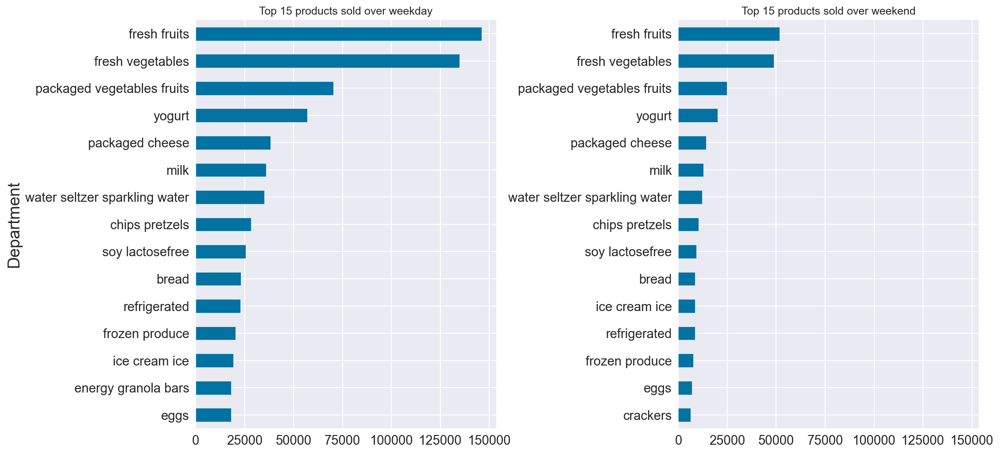

In [50]:
fig, ax = plt.subplots(1,2, sharex= True)
dfs_weekday.product_name.value_counts(ascending= True).iloc[-15:].plot(kind="barh", figsize=(15, 7), xlabel= "Department", title= "Top 15 products sold over weekday", ax= ax[0])
dfs_weekend.product_name.value_counts(ascending= True).iloc[-15:].plot(kind="barh", figsize=(15, 7), title= "Top 15 products sold over weekend", ax= ax[1])
;
# save_fig("Top_15_products_sold_weekday_vs_weekend");

We can see that `ice cream ice` went up 2 ranks, outselling `refigerated` and `frozen produce` during the weekend. Moreover, `energy granola bars` sold less during the weekend and went out of top 15 rank.

## 4. Split customers into different groups based on their purchasing behavior.
   * Justify your choices for you adopted method(s) and model(s).
   * Describe the defined customer groups. What are the features which are driving the different groups?
   * Give suggestions on how the business should treat these clusters differently.

<div class='alert alert-block alert-info'>
    These are the things that we are trying during customer segmenation:
    <ul>
    <li>Perform <strong>PCA</strong> analysis and select 4 component</li>
    <li>Select 5 clusters as the optimal number of clusters for <strong>K-Means</strong> clustering with the elbow method </li>
    <li>Select 4 clusters as the optimal number of clusters for <strong>Gaussian Mixtures</strong> clustering with the elbow method</li>
    <li>Select <strong>Gaussian Mixtures</strong> over K-Means because their clusters have more distinguished characteristics</li>
    <li>Identify characteristics of each cluster group as <code>specific buyers, big swingers, regular users, passerby</code> </li>
    </ul>
</div>

In [51]:
# prepare data for clustering by groupby user_id and aggregate all the columns

dfs_ml = dfs_clean.groupby(by='user_id').agg({
    'order_number': 'max',
    'order_dow': [lambda x: x.mode()[0] if x.mode().size == 1 else -1, 'std'], # mode return int if has one value and -1 if have more than 1 value
    'order_hour_of_day': [lambda x: x.mode()[0] if x.mode().size == 1 else -1, 'std'], # mode return int if have one value and -1 if have more than 1 value
    'days_since_prior_order': 'mean',
    'product_id': lambda x: x.nunique() * 100/ len(products),
    'department_id': lambda x: x.nunique() * 100/ len(departments),
    'reordered': lambda x: x.mean() * 100
})

dfs_ml.columns = ["num_order", "usual_dow", "dow_std", "usual_hour_of_day", "hour_of_day_std", "avg_days_since_prior_order", "product_variance (%)", "department_variance (%)", "percent_reordered"]
dfs_ml['avg_basket_size'] = dfs_clean.groupby(by=['user_id', 'order_id']).product_id.count().to_frame().reset_index().groupby("user_id").product_id.mean()

In [52]:
# preview the dfs_ml

dfs_ml.head()

,num_order,usual_dow,dow_std,usual_hour_of_day,hour_of_day_std,avg_days_since_prior_order,product_variance (%),department_variance (%),percent_reordered,avg_basket_size
user_id,,,,,,,,,,
2,3,5,2.088932,10,0.000000,6.818182,5.970149,19.047619,36.363636,5.500000
3,11,3,1.268143,18,0.512989,12.421053,8.955224,33.333333,47.368421,6.333333
7,3,0,0.000000,18,0.000000,30.000000,12.686567,42.857143,83.333333,24.000000
11,5,5,0.000000,11,0.000000,30.000000,6.716418,19.047619,27.272727,11.000000
13,7,0,0.000000,8,0.000000,7.000000,5.970149,23.809524,60.000000,10.000000


In [53]:
# check for the shape of the dfs_ml

dfs_ml.shape

(102989, 10)

In [54]:
# check for the null values in the dfs_ml

get_missing_value(dfs_ml)

,data_type,number_missing,percent_missing
dow_std,float64,3336,3.24
hour_of_day_std,float64,3336,3.24


In [55]:
# std can only get as low as 0 therefore we will fill -1 to differentiate null value

dfs_ml = dfs_ml.fillna(-1)

In [56]:
# check for the null values in the dfs_ml again to make sure they are

get_missing_value(dfs_ml, extented= True)

,data_type,number_missing,percent_missing
num_order,int64,0,0.0
usual_dow,int64,0,0.0
dow_std,float64,0,0.0
usual_hour_of_day,int64,0,0.0
hour_of_day_std,float64,0,0.0
avg_days_since_prior_order,float64,0,0.0
product_variance (%),float64,0,0.0
department_variance (%),float64,0,0.0
percent_reordered,float64,0,0.0
avg_basket_size,float64,0,0.0


In [57]:
# prepare data for PCA analysis and clustering

scaler = StandardScaler()
scaler.fit(dfs_ml)

scaler = StandardScaler()
scaler.fit(dfs_ml)

dfs_ml_scaled = scaler.transform(dfs_ml)

In [58]:
# perform PCA analysis

pca = PCA()
dfs_ml_scaled_pca = pca.fit_transform(dfs_ml_scaled)

''

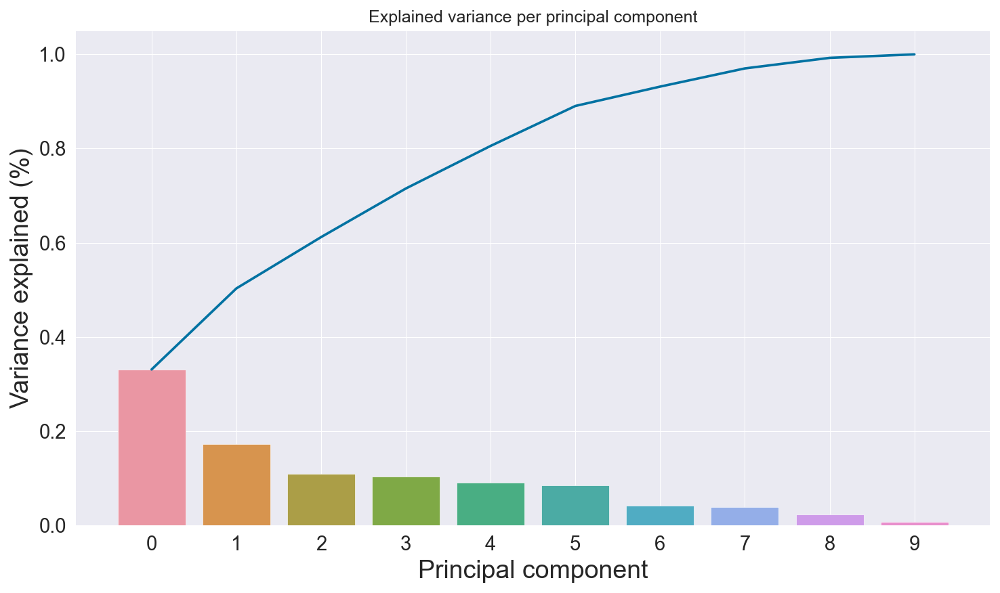

In [59]:
# Scree plot (variance explained by each principal component)
num_components=len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel("Principal component")
ax.set_ylabel("Variance explained (%)")
plt.title('Explained variance per principal component')
;
# save_fig("PCA_scree_plot");

In [60]:
# select the optimal number of component which can explain at least 80% of the variance
cum_expl_var_ratio = np.cumsum(pca.explained_variance_ratio_)
num_components = len(cum_expl_var_ratio[cum_expl_var_ratio <= 0.8])
print("Number of components:", num_components)

# rerun PCA with components that explain 80% of the variance
pca = PCA(num_components).fit(dfs_ml_scaled)
X_pca = pca.transform(dfs_ml_scaled)
X_pca = pd.DataFrame(X_pca)

print("PCA explained variance:", pca.explained_variance_ratio_)

Number of components: 4
PCA explained variance: [0.33098041 0.17205623 0.10900063 0.10317931]


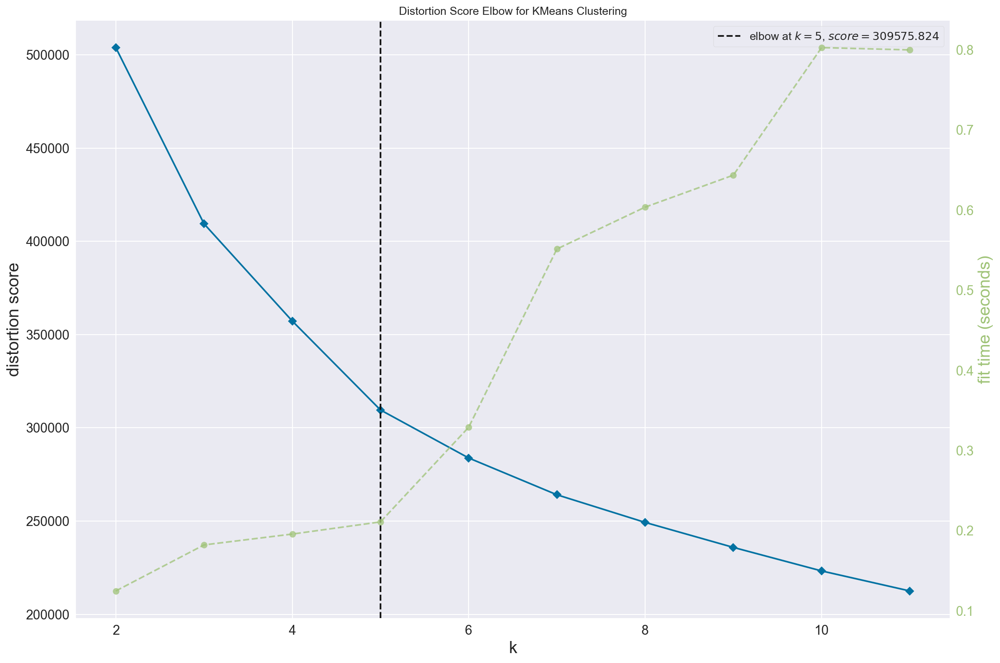

In [61]:
# select optimal number of clusters for K-means with elbow method

kelbow_visualizer(KMeans(random_state=42), X_pca, k=(2,12));

# save_fig("K-means_elbow_plot");

In [62]:
# train k-means with optimal number of clusters

kmeans_model = KMeans(n_clusters= 5, random_state=42).fit(X_pca)
kmeans_clusters = kmeans_model.predict(X_pca)

''

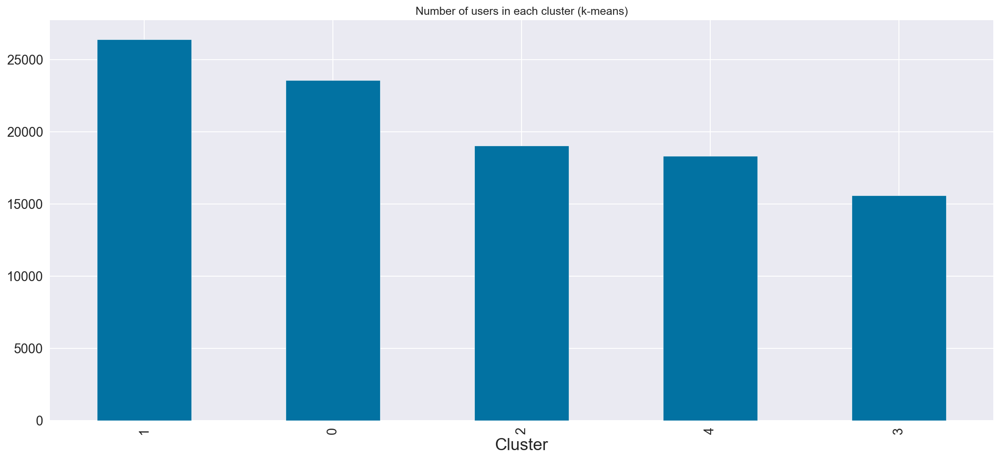

In [63]:
kmeans_result = X_pca.copy()
kmeans_result['cluster'] = kmeans_clusters
kmeans_result.cluster.value_counts().plot(kind="bar", figsize=(15, 7), xlabel= "Cluster", title= "Number of users in each cluster (k-means)")
;
# save_fig("number_of_users_in_each_cluster_k-means");

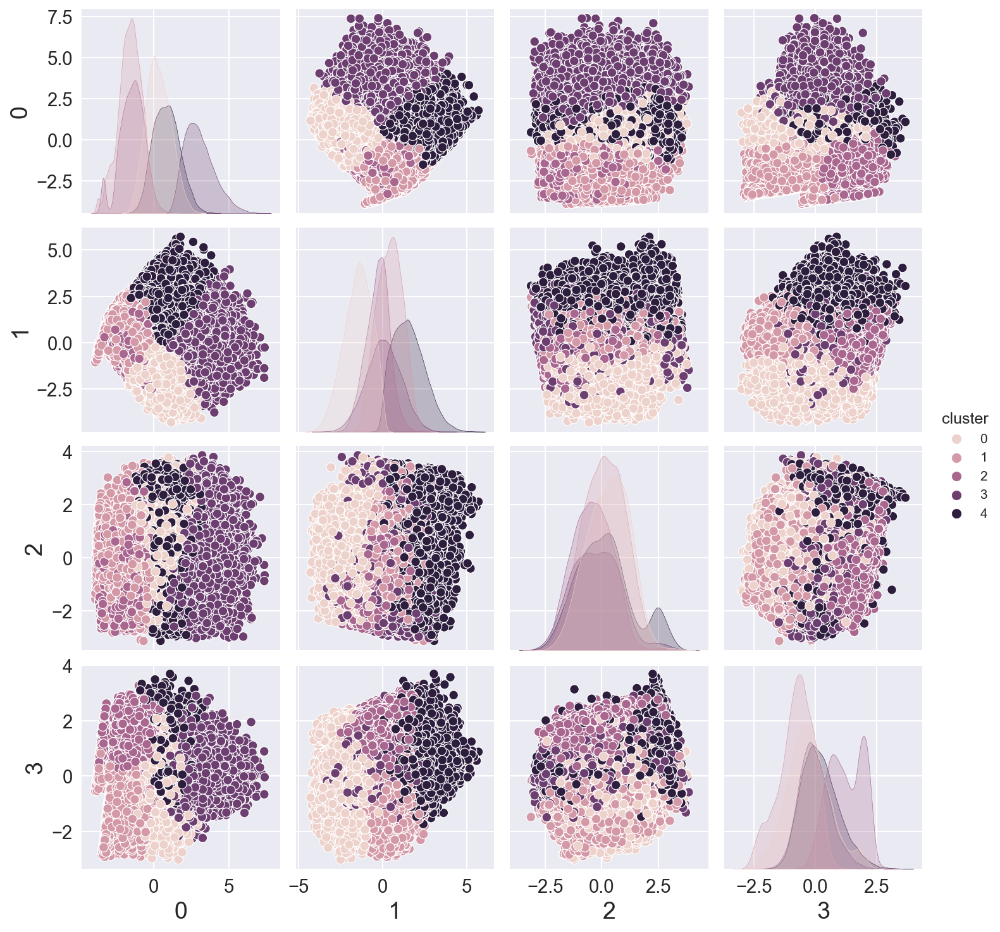

In [64]:
sns.pairplot(kmeans_result, hue='cluster');

# save_fig("k-means_clusters_pairplot");

''

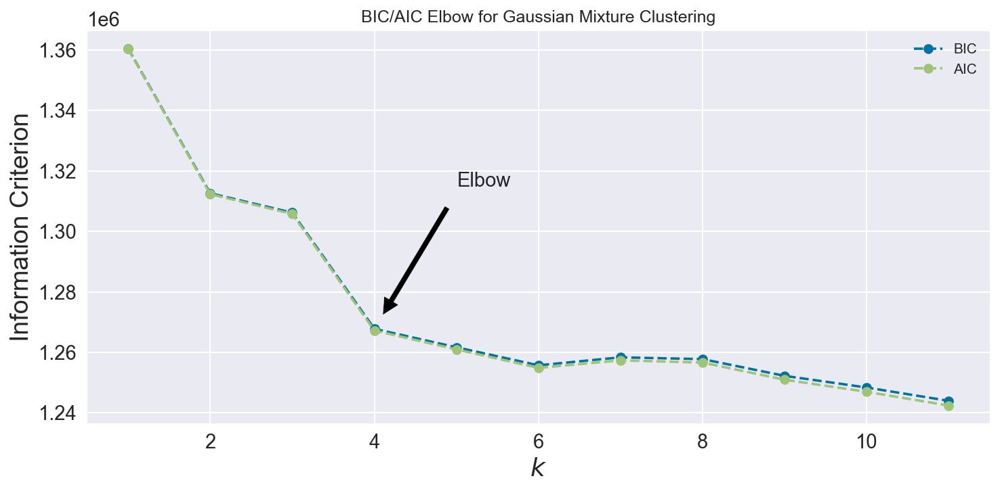

In [65]:
# select optimal number of clusters for Gaussian Mixture Model with elbow method

gms_per_k = [GaussianMixture(n_components=k, random_state=42).fit(X_pca) for k in range(1,12)]
bics = [model.bic(X_pca) for model in gms_per_k]
aics= [model.aic(X_pca) for model in gms_per_k]

plt.figure(figsize=(10, 5))
plt.plot(range(1,12), bics, "bo--", label="BIC")
plt.plot(range(1,12), aics, "go--", label="AIC")
plt.xlabel("$k$")
plt.ylabel("Information Criterion")
plt.annotate("Elbow",
             xy= (4, bics[3]),
             xytext=(0.45, 0.6),
             textcoords='figure fraction',
             fontsize= 14,
             arrowprops=dict(facecolor='black', shrink=0.1))
plt.legend()
plt.title("BIC/AIC Elbow for Gaussian Mixture Clustering")
;
# save_fig("GMM_elbow_plot");

In [66]:
# train GMM with optimal number of clusters

gm_model = GaussianMixture(n_components=4, random_state=42).fit(X_pca)
gm_clusters = gm_model.predict(X_pca)

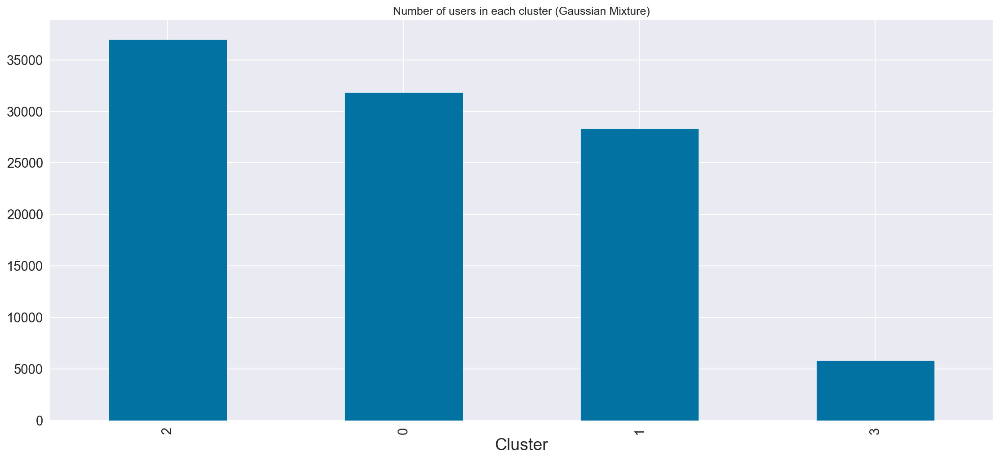

In [67]:
gm_result = X_pca.copy()
gm_result['cluster'] = gm_clusters
gm_result.cluster.value_counts().plot(kind="bar", figsize=(15, 7), xlabel= "Cluster", title= "Number of users in each cluster (Gaussian Mixture)");

# save_fig("number_of_users_in_each_cluster_gmm");

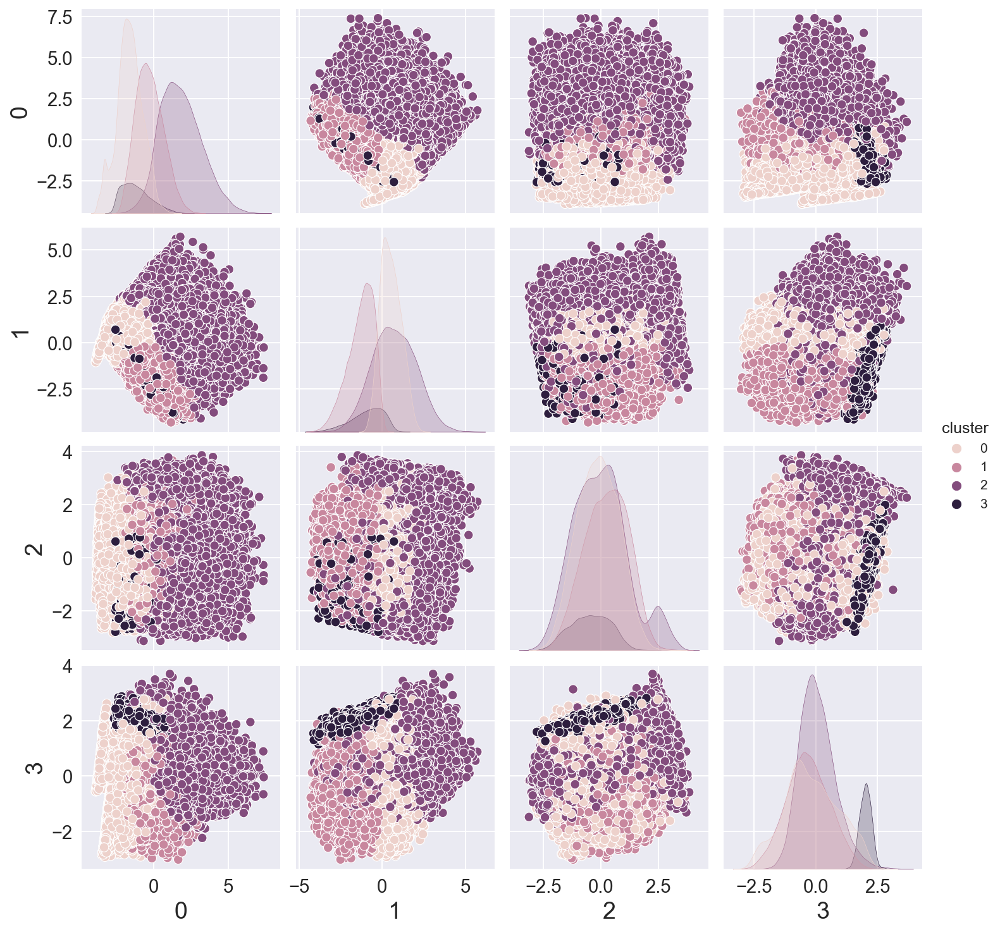

In [68]:
sns.pairplot(gm_result, hue='cluster');
# save_fig("gmm_clusters_pairplot");

In [69]:
# create a new dataframe with the cluster labels

results = dfs_ml.copy()
results['km_cluster'] = kmeans_clusters
results['gm_cluster'] = gm_clusters
results.head()

,num_order,usual_dow,dow_std,usual_hour_of_day,hour_of_day_std,avg_days_since_prior_order,product_variance (%),department_variance (%),percent_reordered,avg_basket_size,km_cluster,gm_cluster
user_id,,,,,,,,,,,,
2,3,5,2.088932,10,0.000000,6.818182,5.970149,19.047619,36.363636,5.500000,2,0
3,11,3,1.268143,18,0.512989,12.421053,8.955224,33.333333,47.368421,6.333333,0,2
7,3,0,0.000000,18,0.000000,30.000000,12.686567,42.857143,83.333333,24.000000,0,1
11,5,5,0.000000,11,0.000000,30.000000,6.716418,19.047619,27.272727,11.000000,1,1
13,7,0,0.000000,8,0.000000,7.000000,5.970149,23.809524,60.000000,10.000000,1,1


In [70]:
# create a k-mean clusters sheet

results.groupby(by='km_cluster').mean()

,num_order,usual_dow,dow_std,usual_hour_of_day,hour_of_day_std,avg_days_since_prior_order,product_variance (%),department_variance (%),percent_reordered,avg_basket_size,gm_cluster
km_cluster,,,,,,,,,,,
0,8.864940,2.526592,0.192665,13.772937,0.365122,15.701070,9.647002,36.562759,47.298212,15.699535,1.229394
1,9.597955,2.725975,-0.021465,13.466263,0.048228,17.525473,3.295054,15.228719,70.185356,5.395557,0.227679
2,5.128594,3.028384,0.051093,13.723872,0.133567,5.358103,4.203654,19.053865,16.375923,6.850046,1.021931
3,32.140310,2.774465,1.567437,12.955239,2.947210,8.438551,15.199876,48.443235,64.900455,13.137282,1.999359
4,27.075567,2.129911,1.320028,10.343573,2.643404,8.555022,6.637996,26.094604,67.323077,6.274427,1.858250


In [71]:
# create GMM clusters sheet

results.groupby(by='gm_cluster').mean()

,num_order,usual_dow,dow_std,usual_hour_of_day,hour_of_day_std,avg_days_since_prior_order,product_variance (%),department_variance (%),percent_reordered,avg_basket_size,km_cluster
gm_cluster,,,,,,,,,,,
0,9.558386,2.871902,0.036493,13.356780,0.162898,12.906641,3.117031,14.562698,57.439988,4.724176,1.425237
1,7.235870,2.634980,0.070123,14.080967,0.144725,17.284573,7.981052,31.679586,44.864771,13.778187,0.484068
2,28.182580,2.418253,1.363569,11.611213,2.637145,8.893397,10.726845,36.951233,65.606001,9.901103,3.120864
3,1.002408,2.760103,0.000000,13.750989,0.000000,-0.998108,5.397261,23.036482,0.000000,9.717627,1.727601


We will use the Gaussian Mixture model because its clusters can be more easily distinguished from each other. Additionally, more interesting conclusions can be drawn from these customer clusters.

In [72]:
# drop k-means cluster column from the results dataframe and get the list of user in each cluster

results = results.drop(columns=['km_cluster'])
user_clusters_index= {i:results[results.gm_cluster == i].index.tolist() for i in results.gm_cluster.unique()}

''

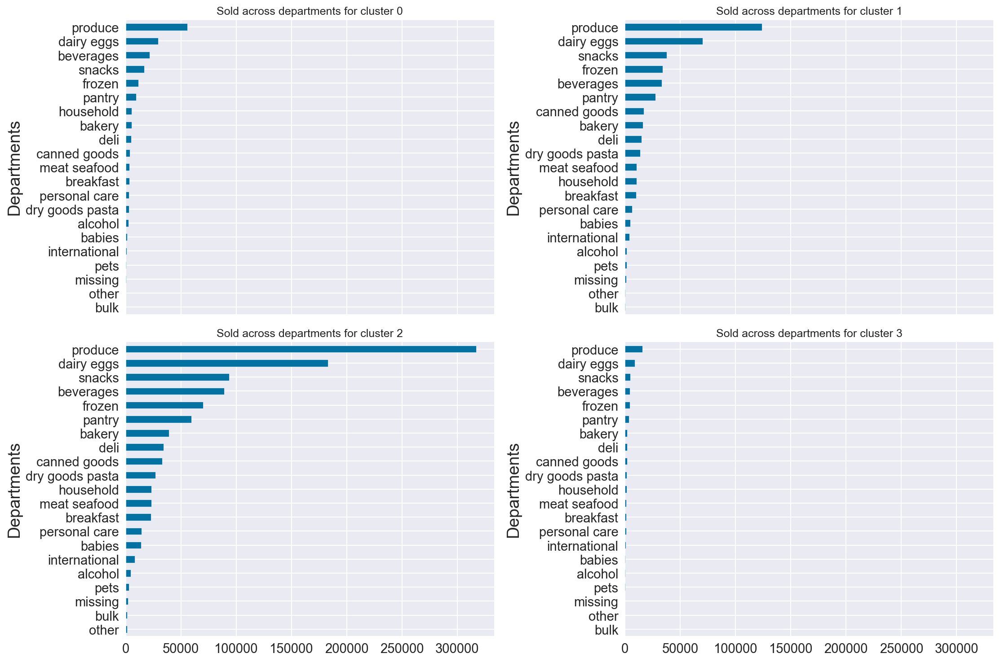

In [73]:
# do different clusters buy from different products/departments?
# distribution of products sold across departments for each cluster

fig, ax = plt.subplots(2, 2, sharex= True)

for i in range(2):
    for j in range(2):
        dfs_clean[dfs_clean.user_id.isin(user_clusters_index[i*2+j])].department.value_counts(ascending= True).plot(kind="barh", xlabel= "Departments", title= f"Sold across departments for cluster {i*2+j}", ax= ax[i,j])
;
# save_fig("departments_clusters_plot");

''

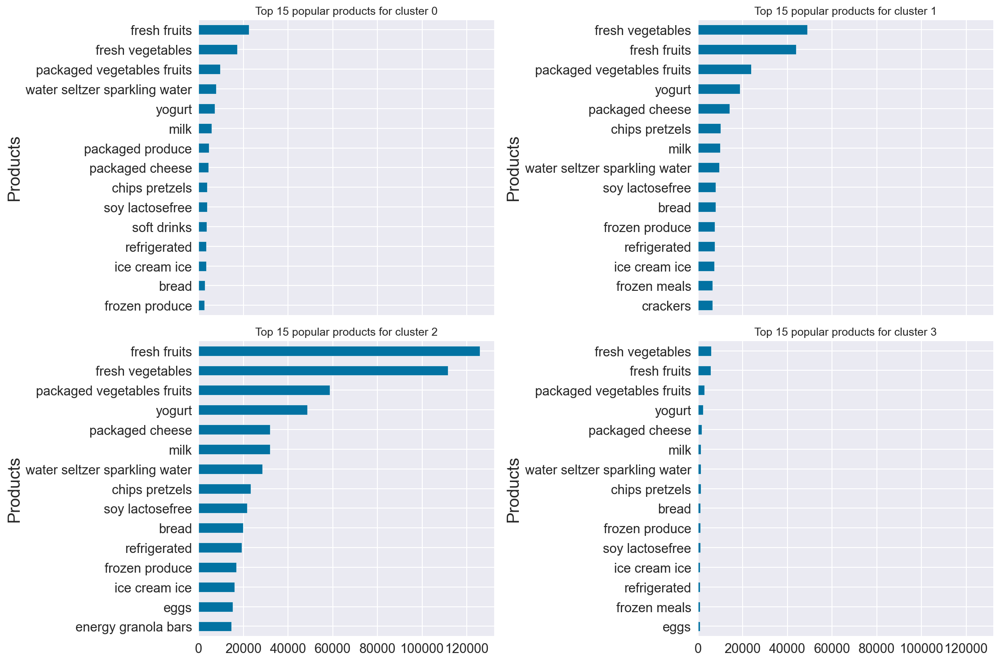

In [74]:
# distribution of top 15 product sold for each cluster

fig, ax = plt.subplots(2, 2, sharex= True)

for i in range(2):
    for j in range(2):
        dfs_clean[dfs_clean.user_id.isin(user_clusters_index[i*2+j])].product_name.value_counts(ascending= True).iloc[-15:].plot(kind="barh", xlabel= "Products", title= f"Top 15 popular products for cluster {i*2+j}", ax= ax[i,j])
;
# save_fig("products_cluster_plot")

''

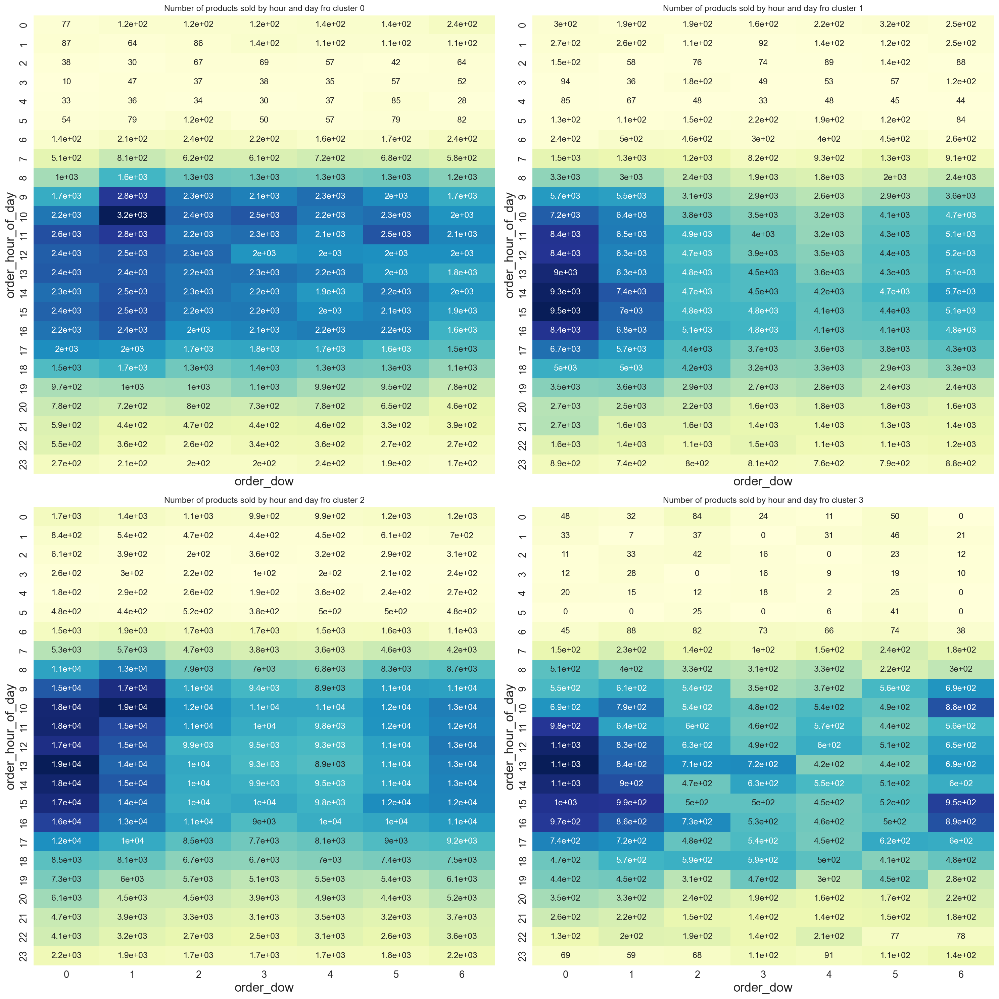

In [75]:
# when did the users in each cluster buy their items?

fig, ax = plt.subplots(2, 2, sharex= True, figsize= (20, 20))

for i in range(2):
    for j in range(2):
        dfs_c = dfs_clean[dfs_clean.user_id.isin(user_clusters_index[i*2+j])]
        h = sns.heatmap(pd.crosstab(dfs_c.order_hour_of_day, dfs_c.order_dow), cmap= "YlGnBu", annot= True, ax= ax[i,j], cbar= False)
        ax[i,j].set_title(f"Number of products sold by hour and day fro cluster {i*2+j}")
;
# save_fig("hour_day_cluster_plot")

### Clusters evaluation

#### Cluster 0: Specific Buyer
Users in **cluster 0** have the lowest product variance and smallest average basket size. However, they have a quite high reorder rate with low deviation on the day of order.

> We suspect that users in this cluster are **specific buyers**, who only buy few specific items each time on specific days and keep reordering them.

The top 5 departments are `produce, dairy eggs, beverages, snacks, and frozen`. The users in this clusters prefer to buy more `beverages` than other clusters, as you can see the surge in `water seltzer sparkling water` sales.

Users in this cluster group have a quite even buying behavior across the week with a peak on **Tuesdays**, unlike normal patterns we observed from other clusters that heavily bought on the beginning of the week and peak on Mondays.

> The users in this cluster buy specific items on specific days with a small basket. Therefore, we want them to:
> * buy more kinds of products by using *cross-selling* techniques such as bundling items together.
> * increase their basket size with a *minimum basket size* through special promotions or free delivery.
> * buy more often as we offer them discount promo-codes with validity lower than their average days since prior order (~13 days).

#### Cluster 1: Big Swingers
Users in **cluster 1** have the biggest average basket size but also longest average day since prior order.

> We suspected that users in this cluster are **big swingers**, who buy a lot of products at a time and reorder them when the items run out.

The top 5 departments are `produce, dairy eggs, snacks, beverages, and frozen`. We can see a surge in `chips pretzels` in this cluster group.

Users in this cluster group have a pattern of buying earlier during the week (Monday) and rarely purchasing at the end of the week (Friday).

> The users in this cluster group bought a lot but not as frequent as we want and their reorder rate could be better. Therefore, we want them to:
> * buy more often as we offer them discount promo-codes with validity lower than there average days since prior order (~17 days).
> * reorder more as we offer them discount if they reorder the same items more.

#### Cluster 2: Regular Users
Users in **cluster 2** have the hightest average number of order, deviation on the day of order, product variance, and reorder rate. They also have the lowest average day since prior order.

> We suspect that users in this cluster are **regular users**, who regularly buy and reorder from us.

The top 5 departments are `produce, dairy eggs, beverages, snacks, and frozen`.

Users in this cluster group have a pattern which we observed from the general pattern of buying heavily on Monday and Tuesday morning.

> The users in this cluster group are our regular users. We want to **retain** them by offering:
> * **membership** / **subscription** with regular discounts and rewards to retain them.
> * **reference programe** with reference rewards, this cluster group are our loyal users and they are most likely to recommend a new user.

#### Cluster 3: Passerby
Users in **cluster 3** have an average number of oder of 1 with average number of days since prior order of -1 (first order) with reorder rate of 0.

> We suspect that users in this cluster are **Passerbies**, who only bought from us once and never reordered again.

The top 5 departments are `produce, dairy eggs, beverages, snacks, and frozen`.

Users in this cluster group surprisingly have a lot of orders on Sunday apart from the normal pattern we observed from overall pattern.

These users appear as a lost cause since they only bought from us once and are gone. We could try:
* **re-engage** them from time to time with promotions and discounts with high minimum basket value to make sure we make profit on every transaction, but they are not where we should focus on.
* **send them a survey** to try to find out how satisfied they were and why they are not buying from us again.

## 5. Implement in your notebook any further ideas (initiatives, further analyses) you might have in mind which can be helpful for the business.

<div class='alert alert-block alert-info'>
    We perform product clustering to identify groups of products and their characteristics
    <ul>
    <li>Select 4 clusters as optimal number of cluster for K-Means clustering with elbow method</li>
    <li>Identify characteristics of 4 clusters as <code>popular products, unpopular products, superstar products, and regular products</code></li>
    </ul>
</div>

<div class='alert alert-block alert-success'>
    Due to limited time and computing power there are things we did not try yet such as:
    <ul>
        <li>Identify relationships between customer clusters and product clusters</li>
        <li>Identify peak-time of each product to optimize inventory management</li>
    </ul>
</div>

In [76]:
# product clusters

products_ml = dfs_clean.groupby("product_id").agg({"order_id": "nunique",
                                     "user_id": "nunique",
                                     "days_since_prior_order": "mean",
                                     "reordered": "mean"})

products_ml.columns = ['n_orders', 'n_user', 'avg_days_since_prior_order', 'reorder_rate']

In [77]:
# preview products_ml

products_ml.head()

,n_orders,n_user,avg_days_since_prior_order,reorder_rate
product_id,,,,
1,3415,2873,10.453818,0.571981
2,4156,3709,10.478687,0.471849
3,14875,11747,10.439260,0.590172
4,8821,7702,11.694181,0.480004
5,3031,2882,10.843624,0.263419


In [78]:
# scale the data for clustering

products_scaler = StandardScaler()
products_scaler.fit(products_ml)

products_ml_scaled = products_scaler.transform(products_ml)

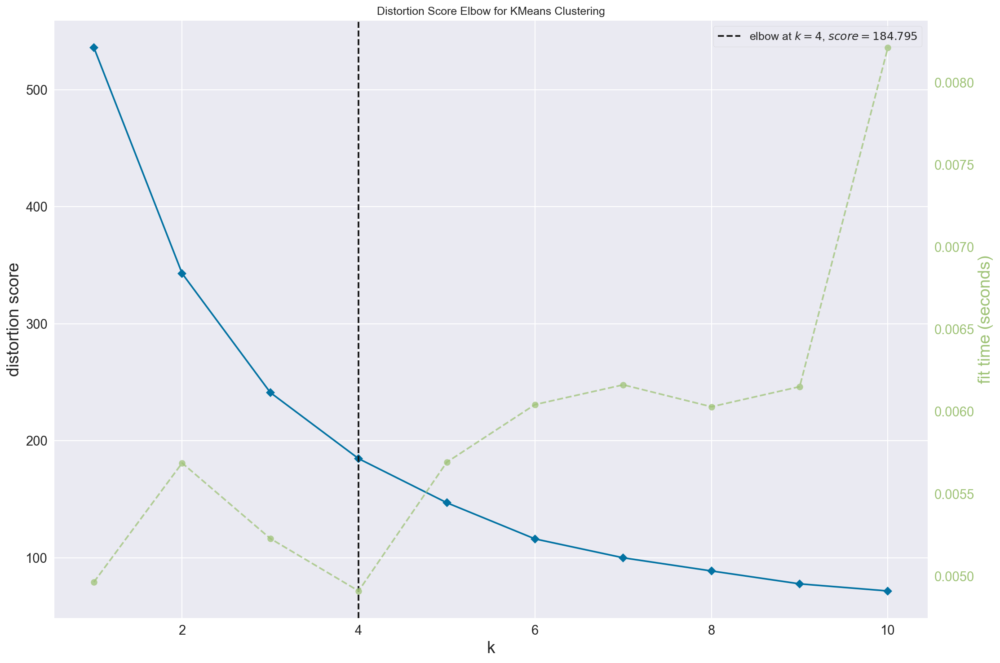

In [79]:
# find the optimal number of clusters

kelbow_visualizer(KMeans(random_state=42), products_ml_scaled, k=(1,11));

# save_fig("products_elbow_plot");

Select optimal number of clusters as **4** according to elbow methods.

In [80]:
# train kmeans model on 4 clusters

products_model = KMeans(n_clusters= 4, random_state=42).fit(products_ml_scaled)
products_clusters = products_model.predict(products_ml_scaled)

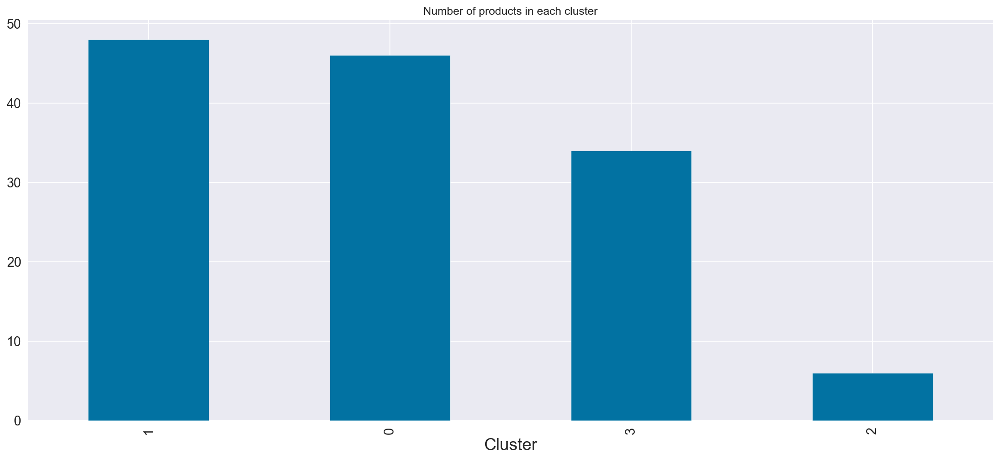

In [81]:
# plot distribution of products based on clusters

products_result = products_ml.copy()
products_result['cluster'] = products_clusters
products_result.cluster.value_counts().plot(kind="bar", figsize=(15, 7), xlabel= "Cluster", title= "Number of products in each cluster");

# save_fig("number_of_products_in_each_cluster_kmeans");

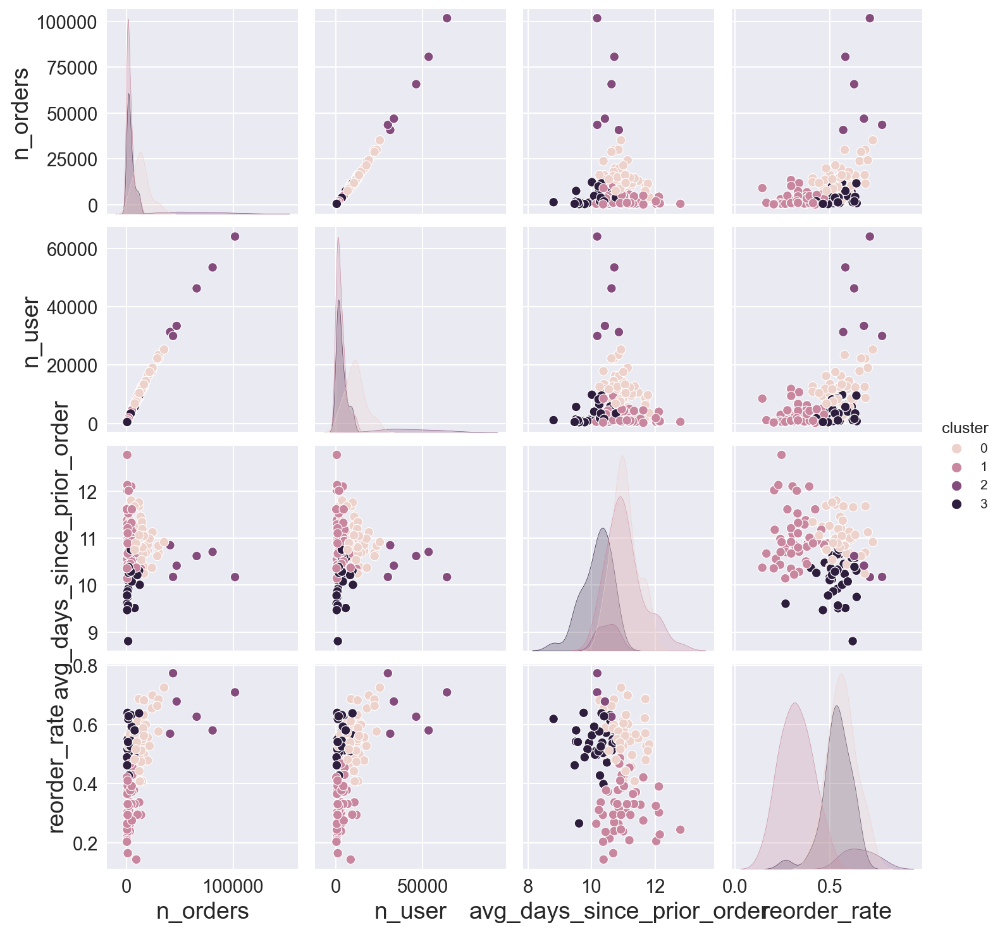

In [82]:
# visualize the clusters using pairplot

sns.pairplot(products_result, hue='cluster');

# save_fig("cluster_of_product_pairplot");

From `pairplot` we can see that:
* **product cluster 0** contains *popular products* with high reorder rate and a lot of users and orders
* **product cluster 1** contains *unpopular products* with low reorder rate and fewer users and orders
* **product cluster 2** contains *superstar products* with very high reorder rate and most number of orders and users buying it
* **product cluster 3** contains *regular products* with high reorder rate but fewer users and orders  

In [83]:
# merge cluster result with products

products_c = pd.merge(products_result, products, on= 'product_id')

In [84]:
# example of products in product_cluster 0 (popular products)

products_c[products_c.cluster == 0].sample(5)

,product_id,n_orders,n_user,avg_days_since_prior_order,reorder_rate,cluster,department_id,product_name
78,79,7468,6306,11.685149,0.570459,0,1,frozen pizza
35,36,12958,11289,11.029074,0.561186,0,16,butter
37,38,13101,10598,11.462386,0.553570,0,1,frozen meals
31,32,11562,8727,11.684288,0.686368,0,4,packaged produce
106,107,29938,23504,10.839939,0.576577,0,19,chips pretzels


In [85]:
# example of products in product_cluster 1 (unpopular products)

products_c[products_c.cluster == 1].sample(5)

,product_id,n_orders,n_user,avg_days_since_prior_order,reorder_rate,cluster,department_id,product_name
19,20,3108,2898,11.092687,0.302721,1,11,oral hygiene
16,17,13515,11849,10.352088,0.294506,1,13,baking ingredients
125,126,985,929,11.215451,0.294421,1,11,feminine care
113,114,4941,4480,11.618816,0.275537,1,17,cleaning products
103,104,9119,8500,10.373088,0.143632,1,13,spices seasonings


In [86]:
# products in product_cluster 2 (superstar products)

products_c[products_c.cluster == 2]

,product_id,n_orders,n_user,avg_days_since_prior_order,reorder_rate,cluster,department_id,product_name
20,21,40791,31355,10.852529,0.569105,2,16,packaged cheese
23,24,101730,64151,10.172448,0.709032,2,4,fresh fruits
82,83,80679,53550,10.710164,0.580282,2,4,fresh vegetables
83,84,43585,30014,10.176022,0.773569,2,16,milk
119,120,46955,33463,10.415901,0.678109,2,16,yogurt
122,123,65760,46351,10.622519,0.626587,2,4,packaged vegetables fruits


In [87]:
# example of products in product_cluster 3 (regular products)

products_c[products_c.cluster == 3].sample(5)

,product_id,n_orders,n_user,avg_days_since_prior_order,reorder_rate,cluster,department_id,product_name
64,65,1806,1541,10.355966,0.504244,3,11,protein meal replacements
92,93,11719,9545,10.310185,0.638168,3,3,breakfast bakery
1,2,4156,3709,10.478687,0.471849,3,16,specialty cheeses
45,46,1000,858,10.660814,0.549880,3,19,mint gum
0,1,3415,2873,10.453818,0.571981,3,20,prepared soups salads


# Ref

* [Hands-on Machine Learning with Scikit-Learn, Keras & TensorFlow](https://www.oreilly.com/library/view/hands-on-machine-learning/9781492032632/)
* [The Hundred-Page Machine Learning Book](https://themlbook.com/)
* [Apriori Algorithm for Association Rule Learning -- How To Find Clear Links Between Transactions](https://towardsdatascience.com/apriori-algorithm-for-association-rule-learning-how-to-find-clear-links-between-transactions-bf7ebc22cf0a)